# Purpose: Verifying that my dataset and the metadata I generated were correct

In [1]:
import tables
import matplotlib.pyplot as plt
import numpy as np
import pickle as pkl

In [2]:
name = "filtered_short_streaks_no_overlapV2"

In [25]:
fileh = tables.open_file('/mnt/etdisk9/ztf_neos/training_examples/batches/' + name + '.h5', mode='r')
with open("/mnt/etdisk9/ztf_neos/training_examples/batches/" + name + "_filtered_indexes.pkl", "rb") as f:
    indexes_filt = pkl.load(f)

In [26]:
# train_images = fileh.root.train_images[:]
# train_labels = fileh.root.train_labels[:]
train_images = fileh.root.val_images
train_labels = fileh.root.val_labels[:]

In [70]:
class PyTablesSequences():

    def __init__(self, x_arr, y_arr, batch_size, buffer_size=2048, filt=None):

        assert buffer_size % batch_size == 0

        self.x, self.y = x_arr, y_arr
        self.batch_size = batch_size
        self.buffer_size = buffer_size
        self.next_load = 0
        self.filter = filt

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        # print(idx)
        idx = idx * self.batch_size
        if idx >= self.next_load or idx < self.next_load - self.buffer_size:
            if self.filter is not None:
                valid = self.filter[idx:idx + self.buffer_size]
                self.x_block = self.x[idx:idx + self.buffer_size][valid]
                self.y_block = self.y[idx:idx + self.buffer_size][valid]
            else:
                self.x_block = self.x[idx:idx + self.buffer_size]
                self.y_block = self.y[idx:idx + self.buffer_size]
            indexes = np.random.permutation(len(self.x_block))
            self.x_block = self.x_block[indexes]
            self.y_block = self.y_block[indexes]
            self.next_load = idx + self.buffer_size

        block_index = idx - (self.next_load - self.buffer_size)
        batch_x = self.x_block[block_index:block_index + self.batch_size]
        batch_y = self.y_block[block_index:block_index + self.batch_size]

        batch_x[~np.isfinite(batch_x)] = 0

        return batch_x, batch_y


In [80]:
train_data = PyTablesSequences(train_images, train_labels, 32, buffer_size=64, filt=np.array(indexes_filt))

In [84]:
print(indexes_filt[:100])

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True False  True False
  True  True False False]


In [86]:
batch_x, batch_y = train_data[3]
print(len(batch_x))

19


(array([  34.,  367., 1594., 3360., 3736., 2299.,  772.,  215.,   91.,
         332.]),
 array([-3.3600054 , -2.524005  , -1.6880043 , -0.85200375, -0.01600323,
         0.8199973 ,  1.6559979 ,  2.4919984 ,  3.3279989 ,  4.1639996 ,
         5.        ], dtype=float32),
 <a list of 10 Patch objects>)

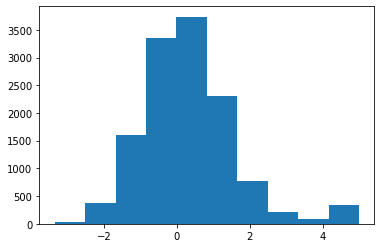

In [69]:
plt.hist(batch_x[0].flat)

1.0


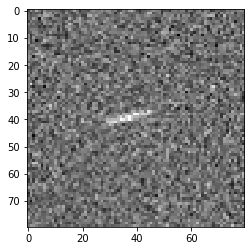

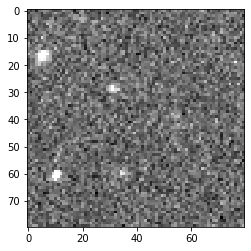

In [67]:
i = 9
print(batch_y[i])
plt.imshow(batch_x[i, ..., 0], cmap="gray")
plt.figure()
plt.imshow(batch_x[i, ..., 1], cmap="gray")

In [12]:
fileh.close()

In [6]:
# with open("/mnt/etdisk9/ztf_neos/training_examples/batches/filtered_short_streaks_only.train.metadata.pkl", "rb") as f:
#     metadata = pkl.load(f)
with open("/mnt/etdisk9/ztf_neos/training_examples/batches/" + name + ".val.metadata.pkl", "rb") as f:
    metadata = pkl.load(f)

In [21]:
for i in range(len(train_images)):
    if np.sum(np.isnan(train_images[i,...,1])) > 0:
        print(i)

112
1040
1538
1566
1613
1644
1652
2406
2662
2688
3163
3181
3182
3186
3191
3195
3199
3203
3207
3209
3220
3611
3613
3920
3927
4081
4262
4850
4854
4862
4863
4870
4871
4875
4879
4880
4885
4891
4895
5116
5326
5335
5338
5342
5546
5550
5552
5558
5745
5748
5926
5947
5950
5951
5953
6446
6758
6773
6774
6776
6784
7501
7643
7958
7977
7980
8320
8445
8612
8618
8625
8726
9078
9080
9088
9166
9248
9340
9342
9976
9982
10192
10374
10381
10733
10734
10748
10752
11018
11130
11606
12342
12348
12349
12353
12354
12355
12356
12359
12361
12362
12364
12365
12367
12368
12369
12372
12380
12382
12383
12384
12386
12389
12394
12396
12405
12406
12414
12421
12430
12431
12433
12435
12438
12442
12444
12445
12448
12899
13145
13293
13604
13608
13628
13650
14301
14302
14312
14315
14319
14322
14329
14337
14347
14352
14601
14610
14614
15086
15091
15098
15100
15103
15107
15108
15113
15115
15116
15117
15124
15126
15127
15129
15130
15131
15132
15135
15138
15140
15144
15150
15153
15154
15157
15158
15160
15162
15172
15177
15178
15

KeyboardInterrupt: 

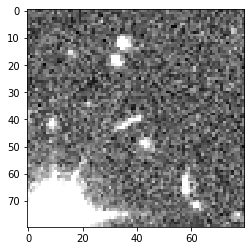

In [22]:
plt.imshow(train_images[112, ..., 1], cmap="gray")

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


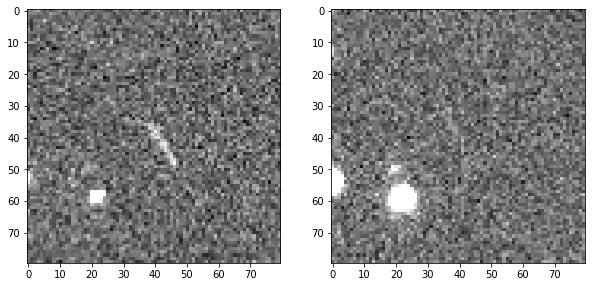

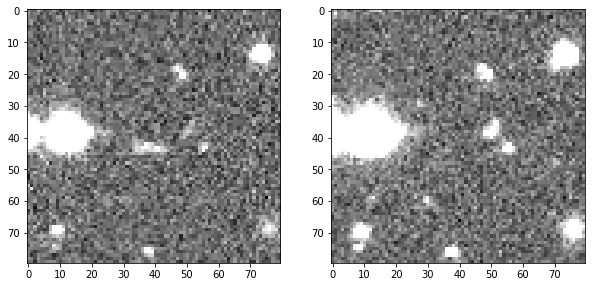

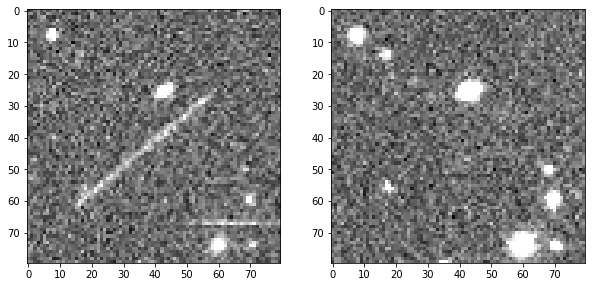

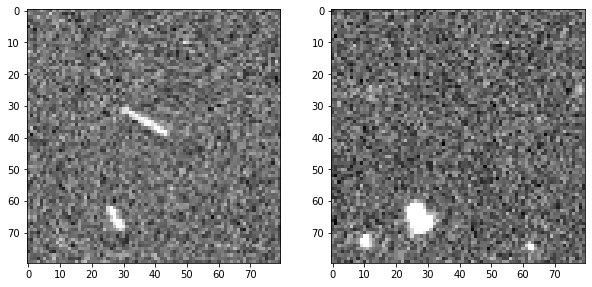

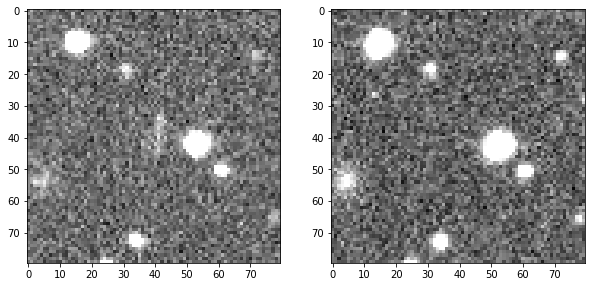

...

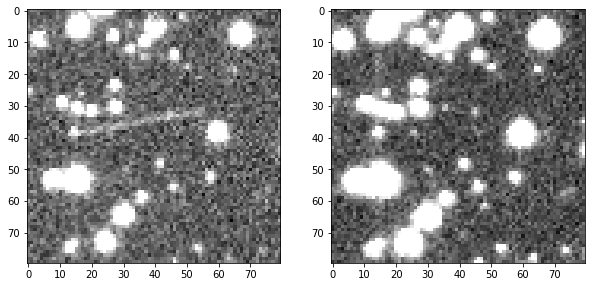

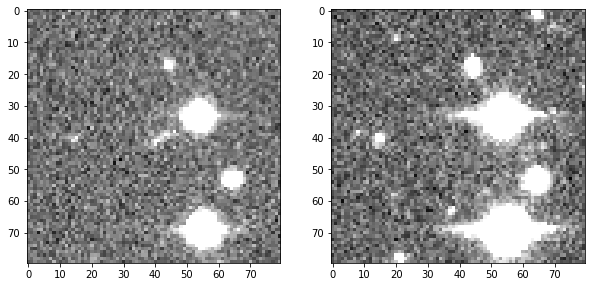

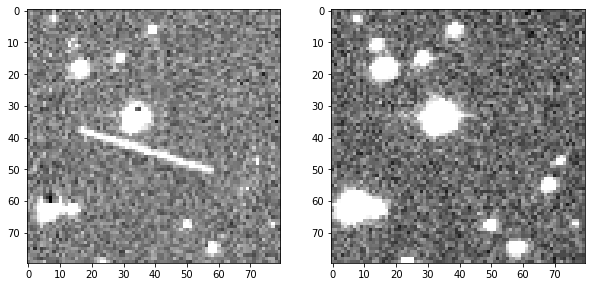

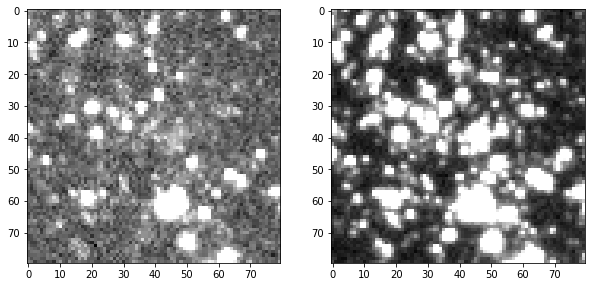

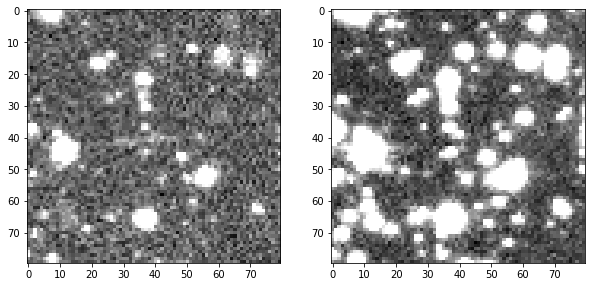

In [10]:
for i in range(40):
    i = np.random.choice(np.where(train_labels == 1)[0])
    # print(train_labels[i])
    # print(metadata[i])
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(train_images[i][..., 0], cmap="gray")
    plt.subplot(1, 2, 2)
    plt.imshow(train_images[i][..., 1], cmap="gray")

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


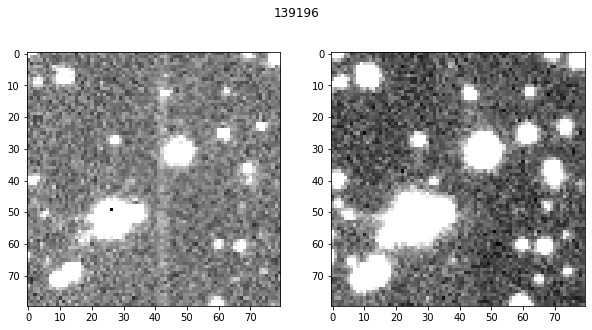

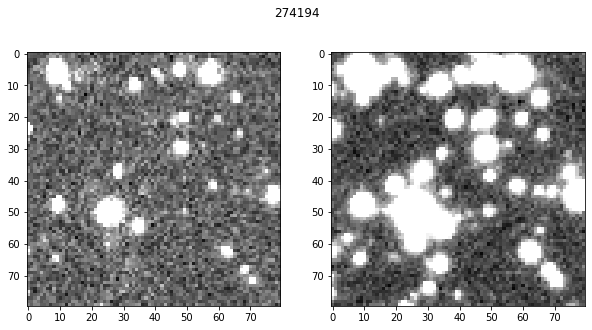

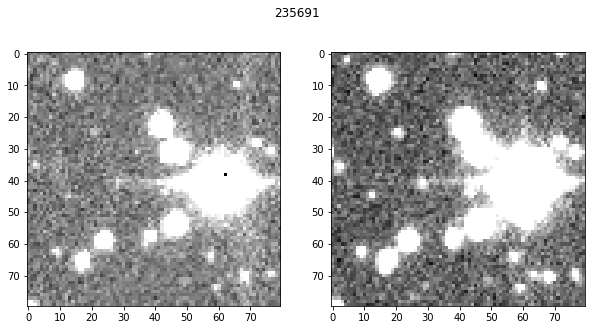

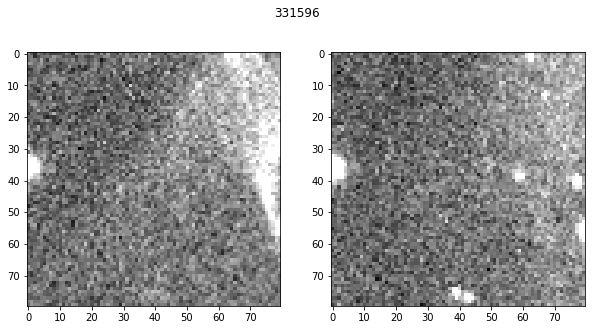

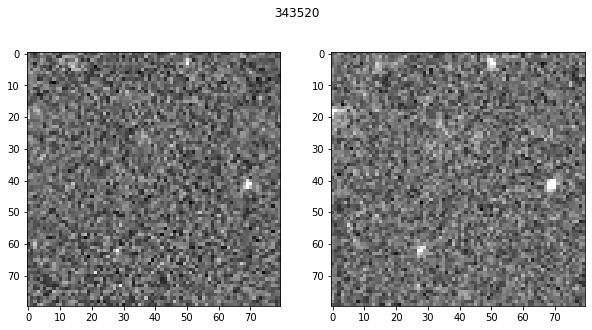

...

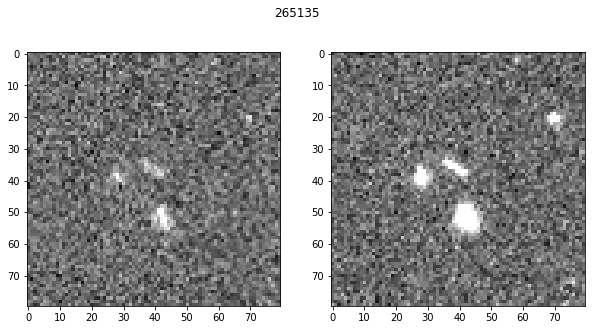

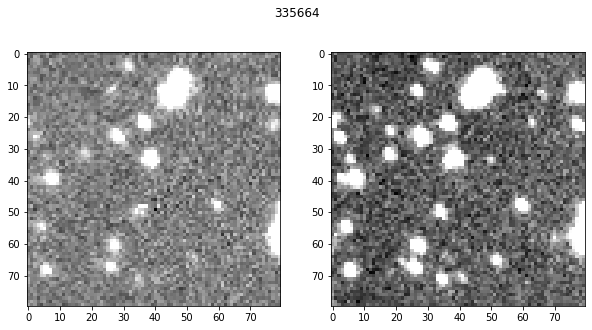

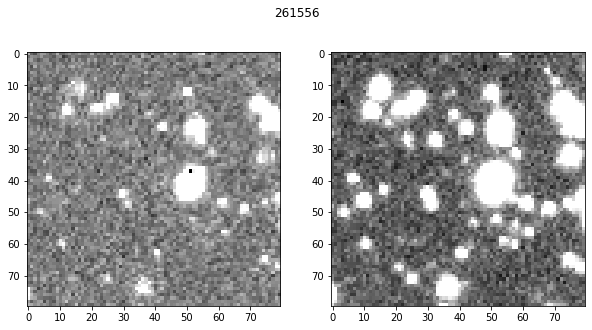

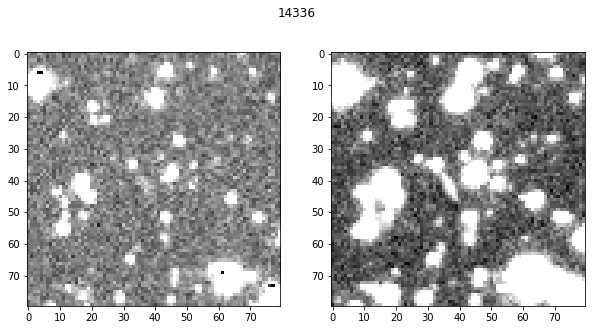

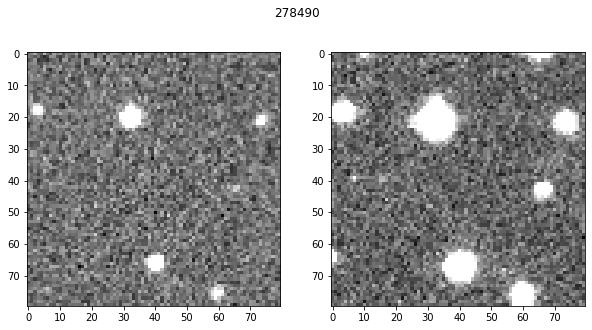

In [11]:
for i in range(40):
    i = np.random.choice(np.where(train_labels == 0)[0])
    # print(train_labels[i])
    # print(metadata[i])
    plt.figure(figsize=(10, 5))
    plt.suptitle(i)
    plt.subplot(1, 2, 1)
    plt.imshow(train_images[i][..., 0], cmap="gray")
    plt.subplot(1, 2, 2)
    plt.imshow(train_images[i][..., 1], cmap="gray")

In [15]:
metadata[156]

{'sci_file': '/mnt/etdisk9/ztf_neos/training_examples/science/ztf_20180907357025_000394_zg_c03_o_q2_sciimg.fits',
 'ref_file': '/mnt/etdisk9/ztf_neos/training_examples/reference/ztf_000394_zg_c03_q2_refimg.fits',
 'slice': (slice(73, 153, None), slice(802, 882, None)),
 'real_slice': (slice(106, 113, None), slice(833, 842, None))}

In [10]:
import matplotlib

/opt/anaconda/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


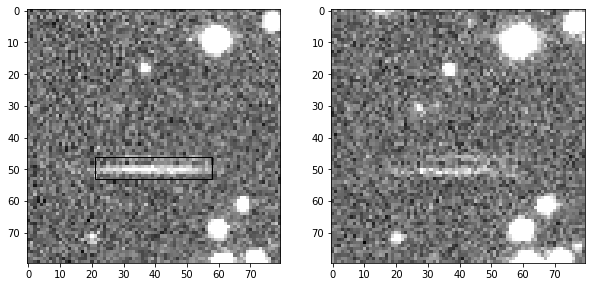

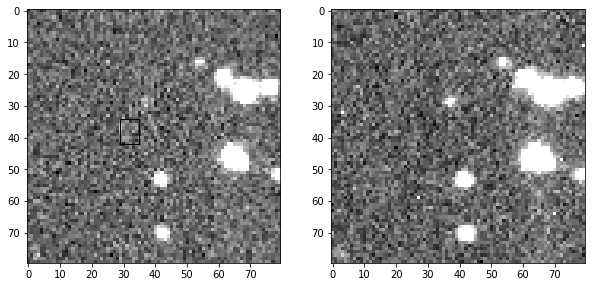

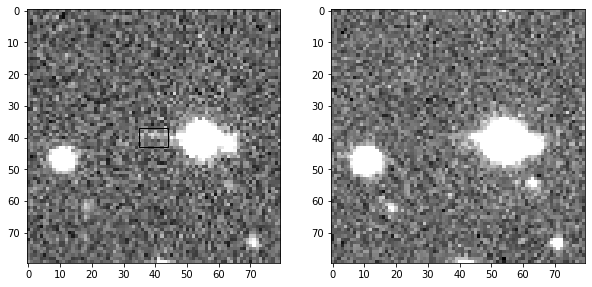

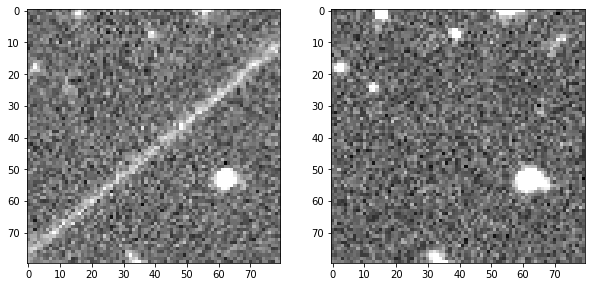

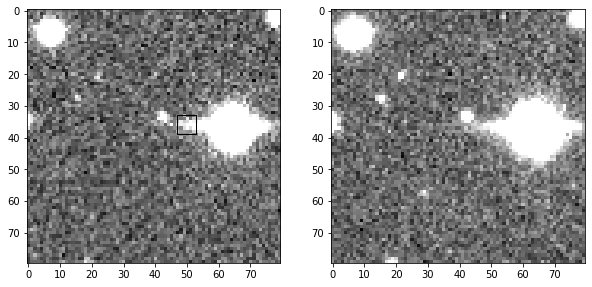

...

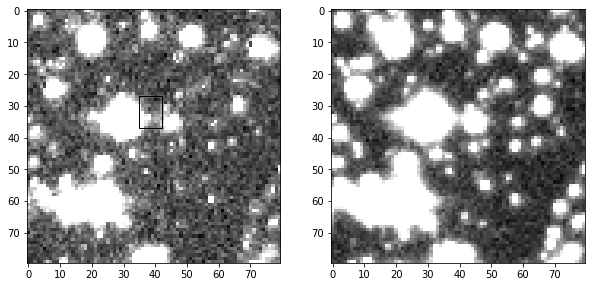

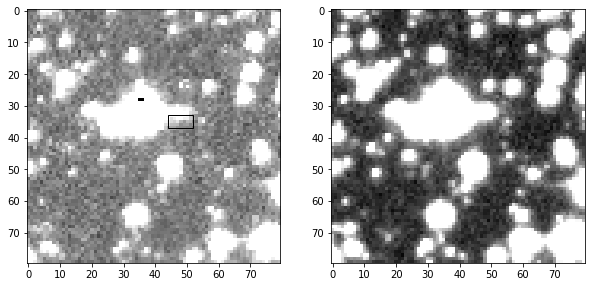

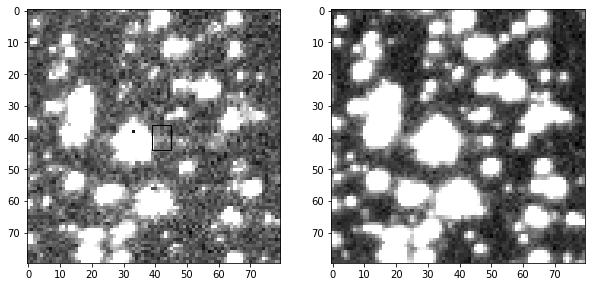

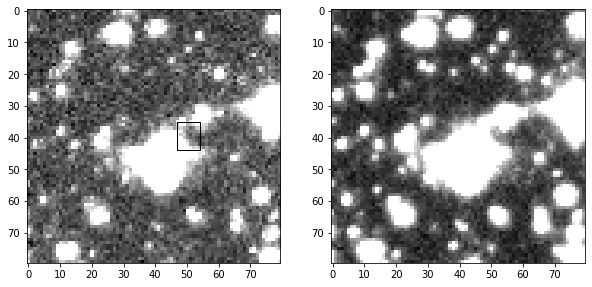

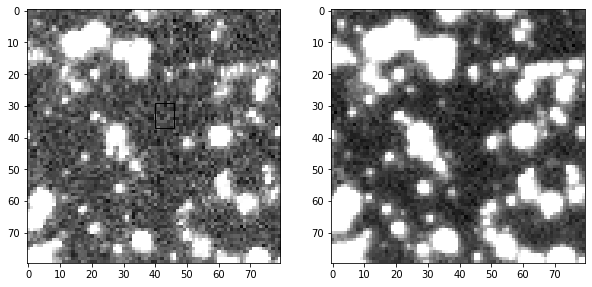

In [11]:
for i in range(500):
#     i = np.random.choice(np.where(train_labels == 0)[0])
    # print(train_labels[i])
    # print(metadata[i])
    
    if "real_slice" not in metadata[i]:
        continue
        
    y = metadata[i]["slice"][0].start
    x = metadata[i]["slice"][1].start
    
    ymin, ymax = metadata[i]["real_slice"][0].start, metadata[i]["real_slice"][0].stop
    xmin, xmax = metadata[i]["real_slice"][1].start, metadata[i]["real_slice"][1].stop
    
    ymin -= y
    ymax -= y
    xmin -= x
    xmax -= x
    
    plt.figure(figsize=(10, 5))
    ax = plt.subplot(1, 2, 1)
    ax.imshow(train_images[i][..., 0], cmap="gray")
    
    rect = matplotlib.patches.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, fill=False)
    ax.add_patch(rect)
    
    plt.subplot(1, 2, 2)
    plt.imshow(train_images[i][..., 1], cmap="gray")

In [54]:
print(metadata[1])

{'sci_file': '/mnt/etdisk9/ztf_neos/training_examples/science/ztf_20181109418981_000509_zg_c08_o_q1_sciimg.fits', 'ref_file': '/mnt/etdisk9/ztf_neos/training_examples/reference/ztf_000509_zg_c08_q1_refimg.fits', 'slice': (slice(513, 593, None), slice(1567, 1647, None))}
